This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

https://www.kaggle.com/harlfoxem/housesalesprediction

**Columns**
    
* **id** - Unique ID for each home sold
* **date** - Date of the home sale
* **price** - Price of each home sold
* **bedrooms** - Number of bedrooms
* **bathrooms** - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* **sqft_living** - Square footage of the apartments interior living space
* **sqft_lot** - Square footage of the land space
* **floors** - Number of floors
* **waterfront** - A dummy variable for whether the apartment was overlooking the waterfront or not
* **view** - An index from 0 to 4 of how good the view of the property was
* **condition** - An index from 1 to 5 on the condition of the apartment,
* **grade** - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* **sqft_above** - The square footage of the interior housing space that is above ground level
* **sqft_basement** - The square footage of the interior housing space that is below ground level
* **yr_built** - The year the house was initially built
* **yr_renovated** - The year of the house’s last renovation
* **zipcode** - What zipcode area the house is in
* **lat** - Lattitude
* **long** - Longitude
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam

from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

import plotly.express as px
import plotly.graph_objects as go

# Loading the data

In [2]:
df = pd.read_csv('./data/kc_house_data.csv')
df.drop('id', axis=1, inplace=True) # uselsess column
df.drop('zipcode', axis=1, inplace=True) # lacking domain knowledge to make conclusions out of it
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,47.6168,-122.045,1800,7503


In [3]:
df.isnull().sum()

date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
price,21597.0,540296.573506,367368.140101,78000.0000,322000.0000,450000.0000,645000.000,7.700000e+06
bedrooms,21597.0,3.373200,0.926299,1.0000,3.0000,3.0000,4.000,3.300000e+01
bathrooms,21597.0,2.115826,0.768984,0.5000,1.7500,2.2500,2.500,8.000000e+00
sqft_living,21597.0,2080.321850,918.106125,370.0000,1430.0000,1910.0000,2550.000,1.354000e+04
sqft_lot,21597.0,15099.408760,41412.636876,520.0000,5040.0000,7618.0000,10685.000,1.651359e+06
floors,21597.0,1.494096,0.539683,1.0000,1.0000,1.5000,2.000,3.500000e+00
waterfront,21597.0,0.007547,0.086549,0.0000,0.0000,0.0000,0.000,1.000000e+00
view,21597.0,0.234292,0.766390,0.0000,0.0000,0.0000,0.000,4.000000e+00
condition,21597.0,3.409825,0.650546,1.0000,3.0000,3.0000,4.000,5.000000e+00
grade,21597.0,7.657915,1.173200,3.0000,7.0000,7.0000,8.000,1.300000e+01


# Data exploration

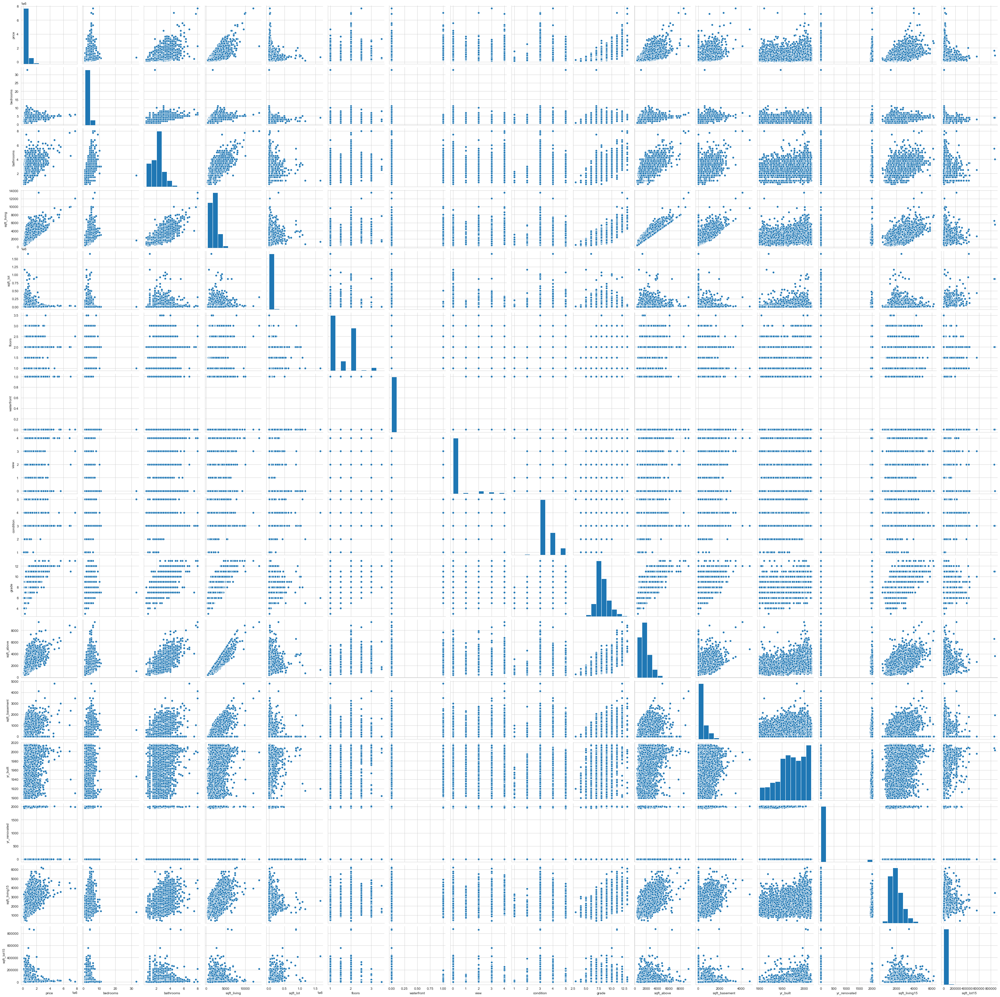

In [5]:
sns.pairplot(df.drop(columns=['lat', 'long']))
plt.show()

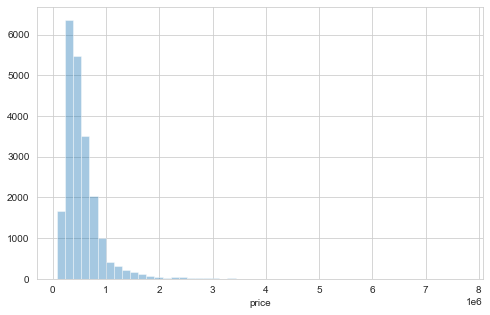

In [6]:
plt.figure(figsize=(8, 5))
ax = sns.distplot(df['price'], kde=False)

Log-y plot to emphasize the small numbers

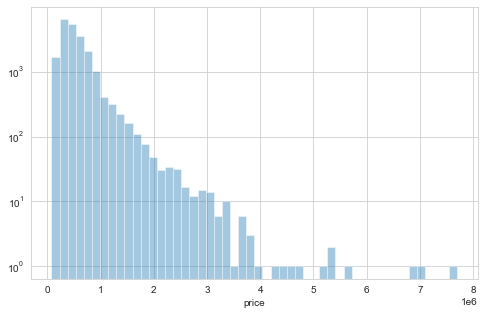

In [7]:
plt.figure(figsize=(8, 5))
ax = sns.distplot(df['price'], kde=False)

ax.set_yscale('log')

Safe to drop prices  $> \sim \$3\,m$

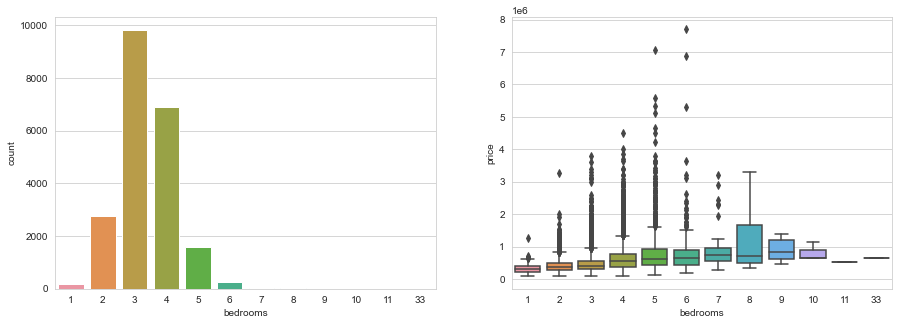

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.countplot(df['bedrooms'], ax=ax[0])
sns.boxplot(x='bedrooms',y='price',data=df, ax=ax[1])
plt.show()

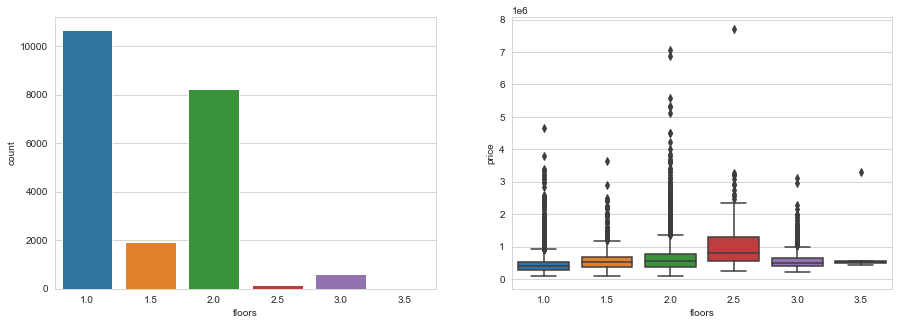

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.countplot(df['floors'], ax=ax[0])
sns.boxplot(x='floors',y='price',data=df, ax=ax[1])
plt.show()

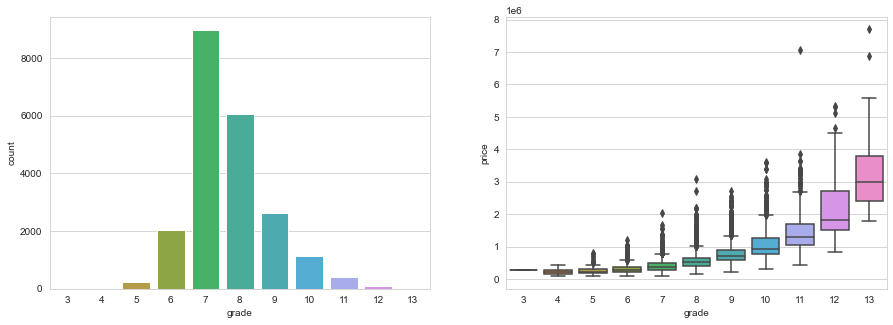

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.countplot(df['grade'], ax=ax[0])
sns.boxplot(x='grade',y='price',data=df, ax=ax[1])
plt.show()

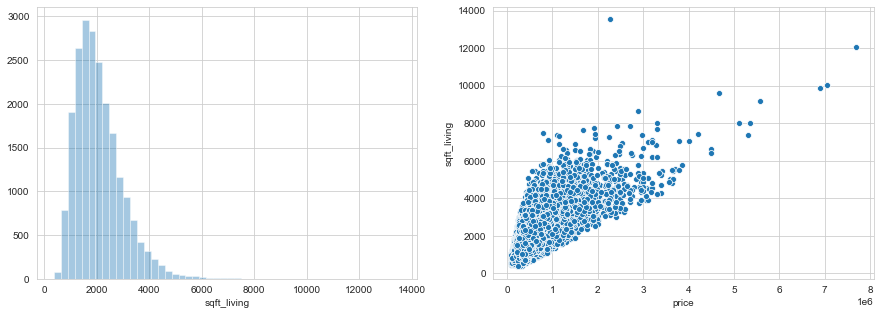

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df['sqft_living'], kde=False, ax=ax[0])
sns.scatterplot(x='price',y='sqft_living',data=df, ax=ax[1])
plt.show()

`price` scewing the results:

In [12]:
fig = px.scatter_mapbox(data_frame=df, lat='lat', lon='long', color='price')
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

## Filtering for the outlier values

In [13]:
df_filt = df[df['price'] < 3.2 * 1e6].copy()

In [14]:
fig = px.scatter_mapbox(data_frame=df_filt, lat='lat', lon='long', color='price')
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [15]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

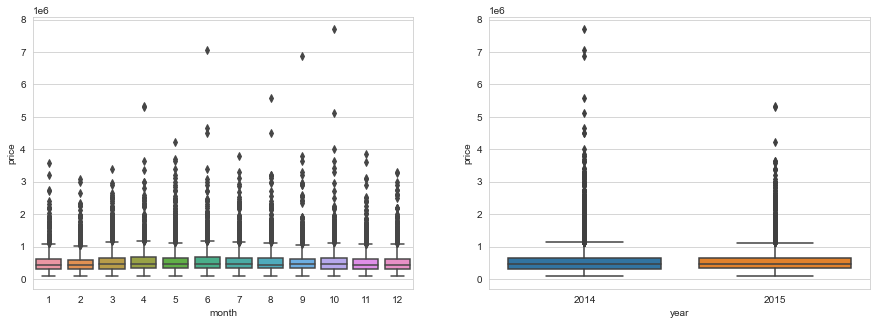

In [16]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.boxplot(x='year', y='price', data=df, ax=ax[1])
sns.boxplot(x='month', y='price', data=df, ax=ax[0])
plt.show()

In [17]:
df.drop(columns=['date'], inplace=True) # not particularly important when the sale was made

# Model training

In [18]:
X = df.drop('price',axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)
scaler = MinMaxScaler() # create an instance of the Sclaer
X_train= scaler.fit_transform(X_train) #fit transform the X_train
X_test = scaler.transform(X_test) # transform the X_test - no fit to avoid data leakage

In [19]:
X_train.shape, X_test.shape

((15117, 19), (6480, 19))

## Creating the `tf` model

In [20]:
model = Sequential()

In [21]:
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))

model.add(Dense(1)) # final layer
model.compile(optimizer='adam', loss='mse')

In [22]:
with tf.device("/device:GPU:0"):
    model.fit(x=X_train,y=y_train.values,
          validation_data=(X_test,y_test.values),
          batch_size=128,epochs=400)

Epoch 1/400
119/119 [==============================] - 0s 2ms/step - loss: 429847445504.0000 - val_loss: 419819716608.0000
Epoch 2/400
119/119 [==============================] - 0s 1ms/step - loss: 428719046656.0000 - val_loss: 415799574528.0000
Epoch 3/400
119/119 [==============================] - 0s 1ms/step - loss: 411729821696.0000 - val_loss: 376297947136.0000
Epoch 4/400
119/119 [==============================] - 0s 2ms/step - loss: 328264810496.0000 - val_loss: 242954387456.0000
Epoch 5/400
119/119 [==============================] - 0s 1ms/step - loss: 173679132672.0000 - val_loss: 109223739392.0000
Epoch 6/400
119/119 [==============================] - 0s 1ms/step - loss: 103586938880.0000 - val_loss: 94196588544.0000
Epoch 7/400
119/119 [==============================] - 0s 1ms/step - loss: 98722037760.0000 - val_loss: 92533645312.0000
Epoch 8/400
119/119 [==============================] - 0s 1ms/step - loss: 96943636480.0000 - val_loss: 90893434880.0000
Epoch 9/400
119/119 [

119/119 [==============================] - 0s 1ms/step - loss: 37290074112.0000 - val_loss: 36453101568.0000
Epoch 69/400
119/119 [==============================] - 0s 1ms/step - loss: 37115351040.0000 - val_loss: 36410441728.0000
Epoch 70/400
119/119 [==============================] - 0s 1ms/step - loss: 36991197184.0000 - val_loss: 36228861952.0000
Epoch 71/400
119/119 [==============================] - 0s 1ms/step - loss: 36845756416.0000 - val_loss: 36122984448.0000
Epoch 72/400
119/119 [==============================] - 0s 1ms/step - loss: 36694970368.0000 - val_loss: 36045635584.0000
Epoch 73/400
119/119 [==============================] - 0s 1ms/step - loss: 36599709696.0000 - val_loss: 35901607936.0000
Epoch 74/400
119/119 [==============================] - 0s 1ms/step - loss: 36427681792.0000 - val_loss: 35791286272.0000
Epoch 75/400
119/119 [==============================] - 0s 1ms/step - loss: 36288782336.0000 - val_loss: 35704635392.0000
Epoch 76/400
119/119 [===============

Epoch 135/400
119/119 [==============================] - 0s 1ms/step - loss: 32266528768.0000 - val_loss: 32738099200.0000
Epoch 136/400
119/119 [==============================] - 0s 1ms/step - loss: 32244746240.0000 - val_loss: 32697776128.0000
Epoch 137/400
119/119 [==============================] - 0s 1ms/step - loss: 32182511616.0000 - val_loss: 32656214016.0000
Epoch 138/400
119/119 [==============================] - 0s 1ms/step - loss: 32171526144.0000 - val_loss: 32615518208.0000
Epoch 139/400
119/119 [==============================] - 0s 1ms/step - loss: 32141484032.0000 - val_loss: 32602669056.0000
Epoch 140/400
119/119 [==============================] - 0s 1ms/step - loss: 32162230272.0000 - val_loss: 32598521856.0000
Epoch 141/400
119/119 [==============================] - 0s 1ms/step - loss: 32090288128.0000 - val_loss: 32571056128.0000
Epoch 142/400
119/119 [==============================] - 0s 1ms/step - loss: 32074553344.0000 - val_loss: 32648792064.0000
Epoch 143/400
11

119/119 [==============================] - 0s 1ms/step - loss: 30713673728.0000 - val_loss: 31685527552.0000
Epoch 202/400
119/119 [==============================] - 0s 1ms/step - loss: 30714877952.0000 - val_loss: 31622887424.0000
Epoch 203/400
119/119 [==============================] - 0s 1ms/step - loss: 30710632448.0000 - val_loss: 31562801152.0000
Epoch 204/400
119/119 [==============================] - 0s 1ms/step - loss: 30703636480.0000 - val_loss: 31594043392.0000
Epoch 205/400
119/119 [==============================] - 0s 1ms/step - loss: 30688038912.0000 - val_loss: 31512774656.0000
Epoch 206/400
119/119 [==============================] - 0s 1ms/step - loss: 30658088960.0000 - val_loss: 31504650240.0000
Epoch 207/400
119/119 [==============================] - 0s 1ms/step - loss: 30628179968.0000 - val_loss: 31494959104.0000
Epoch 208/400
119/119 [==============================] - 0s 1ms/step - loss: 30647173120.0000 - val_loss: 31487844352.0000
Epoch 209/400
119/119 [=======

119/119 [==============================] - 0s 1ms/step - loss: 29905219584.0000 - val_loss: 30898978816.0000
Epoch 268/400
119/119 [==============================] - 0s 2ms/step - loss: 29875222528.0000 - val_loss: 30906486784.0000
Epoch 269/400
119/119 [==============================] - 0s 1ms/step - loss: 29878362112.0000 - val_loss: 30876919808.0000
Epoch 270/400
119/119 [==============================] - 0s 1ms/step - loss: 29877194752.0000 - val_loss: 30881767424.0000
Epoch 271/400
119/119 [==============================] - 0s 1ms/step - loss: 29870342144.0000 - val_loss: 30905565184.0000
Epoch 272/400
119/119 [==============================] - 0s 1ms/step - loss: 29824133120.0000 - val_loss: 30913193984.0000
Epoch 273/400
119/119 [==============================] - 0s 2ms/step - loss: 29806329856.0000 - val_loss: 30860609536.0000
Epoch 274/400
119/119 [==============================] - 0s 1ms/step - loss: 29808926720.0000 - val_loss: 30882256896.0000
Epoch 275/400
119/119 [=======

119/119 [==============================] - 0s 2ms/step - loss: 29203609600.0000 - val_loss: 30391924736.0000
Epoch 334/400
119/119 [==============================] - 0s 1ms/step - loss: 29171122176.0000 - val_loss: 30408812544.0000
Epoch 335/400
119/119 [==============================] - 0s 1ms/step - loss: 29158342656.0000 - val_loss: 30366818304.0000
Epoch 336/400
119/119 [==============================] - 0s 1ms/step - loss: 29210388480.0000 - val_loss: 30384775168.0000
Epoch 337/400
119/119 [==============================] - 0s 1ms/step - loss: 29152587776.0000 - val_loss: 30455545856.0000
Epoch 338/400
119/119 [==============================] - 0s 1ms/step - loss: 29167689728.0000 - val_loss: 30351452160.0000
Epoch 339/400
119/119 [==============================] - 0s 1ms/step - loss: 29127886848.0000 - val_loss: 30347902976.0000
Epoch 340/400
119/119 [==============================] - 0s 1ms/step - loss: 29120555008.0000 - val_loss: 30341113856.0000
Epoch 341/400
119/119 [=======

119/119 [==============================] - 0s 1ms/step - loss: 28509356032.0000 - val_loss: 29867040768.0000
Epoch 400/400
119/119 [==============================] - 0s 1ms/step - loss: 28492851200.0000 - val_loss: 29949102080.0000


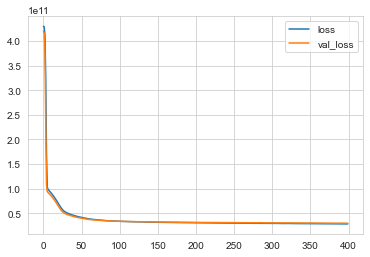

In [23]:
losses = pd.DataFrame(model.history.history)
losses.plot()

## Predicting

In [24]:
pred = model.predict(X_test)

In [25]:
print(f'mean absolute error: {mean_absolute_error(y_test, pred)}')
print(f'root mean squared error: {np.sqrt(mean_squared_error(y_test, pred))}')
print(f'explained variance: {explained_variance_score(y_test,pred)}')
print(f'R\u00b2 score: {r2_score(y_test,pred)}')

mean absolute error: 106947.58592423804
root mean squared error: 173058.0891016857
explained variance: 0.7700029533489912
R² score: 0.7691045864305607


In [26]:
err = pd.Series(pred.tolist()).apply(lambda x: x[0]) - y_test.reset_index(drop=True)

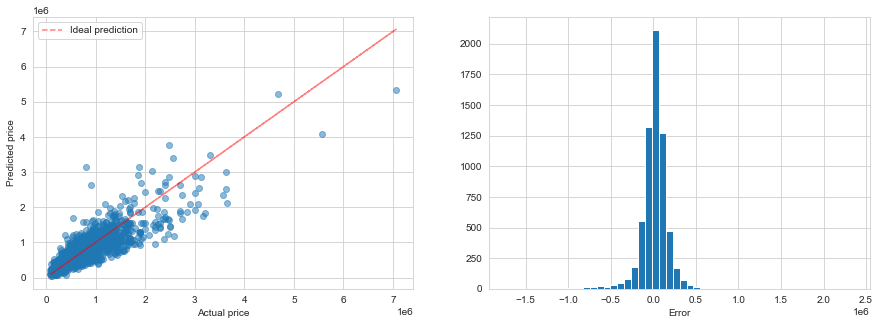

In [27]:
# Predictions
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(y_test, pred, alpha=0.5)
ax[0].plot(y_test, y_test, '--r', alpha=0.5,  label='Ideal prediction')
ax[0].set_ylabel('Predicted price')
ax[0].set_xlabel('Actual price')

ax[1].hist(x=err, bins=50)
ax[1].set_xlabel('Error')
ax[0].legend()
plt.show()

## Using the filtered dataframe
Excluding outlier values

In [28]:
model = Sequential()
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))

model.add(Dense(1)) # final layer
model.compile(optimizer='adam', loss='mse')

In [29]:
df_filt['date'] = pd.to_datetime(df_filt['date'])
df_filt['year'] = df_filt['date'].dt.year
df_filt['month'] = df_filt['date'].dt.month
df_filt.drop(columns=['date'], inplace=True) # not particularly important when the sale was made

In [30]:
X = df_filt.drop('price',axis=1)
y = df_filt['price']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3)
scaler = MinMaxScaler() # create an instance of the Sclaer
X_train= scaler.fit_transform(X_train) #fit transform the X_train
X_test = scaler.transform(X_test) # transform the X_test - no fit to avoid data leakage

In [31]:
with tf.device("/device:GPU:0"):
    model.fit(x=X_train,y=y_train.values,
          validation_data=(X_test,y_test.values),
          batch_size=128,epochs=400)

Epoch 1/400
118/118 [==============================] - 0s 2ms/step - loss: 396220334080.0000 - val_loss: 397829963776.0000
Epoch 2/400
118/118 [==============================] - 0s 2ms/step - loss: 395319836672.0000 - val_loss: 394628104192.0000
Epoch 3/400
118/118 [==============================] - 0s 1ms/step - loss: 382288953344.0000 - val_loss: 364411682816.0000
Epoch 4/400
118/118 [==============================] - 0s 1ms/step - loss: 317657513984.0000 - val_loss: 257329692672.0000
Epoch 5/400
118/118 [==============================] - 0s 2ms/step - loss: 180677066752.0000 - val_loss: 114359427072.0000
Epoch 6/400
118/118 [==============================] - 0s 2ms/step - loss: 88425840640.0000 - val_loss: 78435770368.0000
Epoch 7/400
118/118 [==============================] - 0s 2ms/step - loss: 77321977856.0000 - val_loss: 76580200448.0000
Epoch 8/400
118/118 [==============================] - 0s 1ms/step - loss: 75993833472.0000 - val_loss: 75224793088.0000
Epoch 9/400
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 32543285248.0000 - val_loss: 31232346112.0000
Epoch 69/400
118/118 [==============================] - 0s 1ms/step - loss: 32421718016.0000 - val_loss: 31051831296.0000
Epoch 70/400
118/118 [==============================] - 0s 1ms/step - loss: 32272402432.0000 - val_loss: 30928570368.0000
Epoch 71/400
118/118 [==============================] - 0s 1ms/step - loss: 32138240000.0000 - val_loss: 30856278016.0000
Epoch 72/400
118/118 [==============================] - 0s 1ms/step - loss: 32042557440.0000 - val_loss: 30715375616.0000
Epoch 73/400
118/118 [==============================] - 0s 1ms/step - loss: 31911141376.0000 - val_loss: 30653472768.0000
Epoch 74/400
118/118 [==============================] - 0s 1ms/step - loss: 31831470080.0000 - val_loss: 30521319424.0000
Epoch 75/400
118/118 [==============================] - 0s 1ms/step - loss: 31750959104.0000 - val_loss: 30434482176.0000
Epoch 76/400
118/118 [===============

Epoch 135/400
118/118 [==============================] - 0s 1ms/step - loss: 28687347712.0000 - val_loss: 27898615808.0000
Epoch 136/400
118/118 [==============================] - 0s 1ms/step - loss: 28694284288.0000 - val_loss: 27880241152.0000
Epoch 137/400
118/118 [==============================] - 0s 1ms/step - loss: 28633853952.0000 - val_loss: 27877234688.0000
Epoch 138/400
118/118 [==============================] - 0s 1ms/step - loss: 28580485120.0000 - val_loss: 28001599488.0000
Epoch 139/400
118/118 [==============================] - 0s 1ms/step - loss: 28584142848.0000 - val_loss: 27828551680.0000
Epoch 140/400
118/118 [==============================] - 0s 1ms/step - loss: 28547436544.0000 - val_loss: 27828903936.0000
Epoch 141/400
118/118 [==============================] - 0s 1ms/step - loss: 28571633664.0000 - val_loss: 27806801920.0000
Epoch 142/400
118/118 [==============================] - 0s 1ms/step - loss: 28472877056.0000 - val_loss: 27832158208.0000
Epoch 143/400
11

118/118 [==============================] - 0s 1ms/step - loss: 27713374208.0000 - val_loss: 26964862976.0000
Epoch 202/400
118/118 [==============================] - 0s 1ms/step - loss: 27688321024.0000 - val_loss: 26976479232.0000
Epoch 203/400
118/118 [==============================] - 0s 1ms/step - loss: 27710334976.0000 - val_loss: 26952005632.0000
Epoch 204/400
118/118 [==============================] - 0s 1ms/step - loss: 27716276224.0000 - val_loss: 26939877376.0000
Epoch 205/400
118/118 [==============================] - 0s 1ms/step - loss: 27683379200.0000 - val_loss: 26931953664.0000
Epoch 206/400
118/118 [==============================] - 0s 1ms/step - loss: 27671447552.0000 - val_loss: 26924759040.0000
Epoch 207/400
118/118 [==============================] - 0s 1ms/step - loss: 27656810496.0000 - val_loss: 26926059520.0000
Epoch 208/400
118/118 [==============================] - 0s 1ms/step - loss: 27637071872.0000 - val_loss: 26924918784.0000
Epoch 209/400
118/118 [=======

118/118 [==============================] - 0s 1ms/step - loss: 27248902144.0000 - val_loss: 26456342528.0000
Epoch 268/400
118/118 [==============================] - 0s 1ms/step - loss: 27243956224.0000 - val_loss: 26439178240.0000
Epoch 269/400
118/118 [==============================] - 0s 1ms/step - loss: 27214264320.0000 - val_loss: 26425446400.0000
Epoch 270/400
118/118 [==============================] - 0s 2ms/step - loss: 27209291776.0000 - val_loss: 26428981248.0000
Epoch 271/400
118/118 [==============================] - 0s 1ms/step - loss: 27218356224.0000 - val_loss: 26430697472.0000
Epoch 272/400
118/118 [==============================] - 0s 1ms/step - loss: 27232403456.0000 - val_loss: 26421938176.0000
Epoch 273/400
118/118 [==============================] - 0s 1ms/step - loss: 27199049728.0000 - val_loss: 26395815936.0000
Epoch 274/400
118/118 [==============================] - 0s 1ms/step - loss: 27195052032.0000 - val_loss: 26387638272.0000
Epoch 275/400
118/118 [=======

118/118 [==============================] - 0s 1ms/step - loss: 26879225856.0000 - val_loss: 26044022784.0000
Epoch 334/400
118/118 [==============================] - 0s 1ms/step - loss: 26872031232.0000 - val_loss: 26058059776.0000
Epoch 335/400
118/118 [==============================] - 0s 1ms/step - loss: 26850273280.0000 - val_loss: 26100852736.0000
Epoch 336/400
118/118 [==============================] - 0s 1ms/step - loss: 26875674624.0000 - val_loss: 26021289984.0000
Epoch 337/400
118/118 [==============================] - 0s 1ms/step - loss: 26890076160.0000 - val_loss: 26005188608.0000
Epoch 338/400
118/118 [==============================] - 0s 1ms/step - loss: 26859132928.0000 - val_loss: 26047875072.0000
Epoch 339/400
118/118 [==============================] - 0s 1ms/step - loss: 26837262336.0000 - val_loss: 26001002496.0000
Epoch 340/400
118/118 [==============================] - 0s 1ms/step - loss: 26834255872.0000 - val_loss: 26001047552.0000
Epoch 341/400
118/118 [=======

118/118 [==============================] - 0s 1ms/step - loss: 26553292800.0000 - val_loss: 25677420544.0000
Epoch 400/400
118/118 [==============================] - 0s 1ms/step - loss: 26476513280.0000 - val_loss: 25700358144.0000


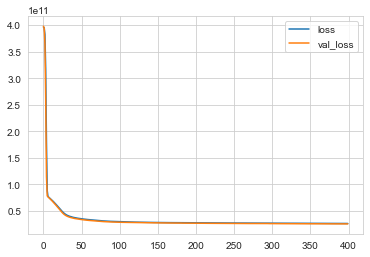

In [32]:
losses = pd.DataFrame(model.history.history)
losses.plot()

In [33]:
pred = model.predict(X_test)
print(f'mean absolute error: {mean_absolute_error(y_test, pred)}')
print(f'root mean squared error: {np.sqrt(mean_squared_error(y_test, pred))}')
print(f'explained variance: {explained_variance_score(y_test,pred)}')
print(f'R\u00b2 score: {r2_score(y_test,pred)}')

mean absolute error: 100103.47873424938
root mean squared error: 160313.29514246268
explained variance: 0.7720476197446525
R² score: 0.7717376740563706


In [34]:
err = pd.Series(pred.tolist()).apply(lambda x: x[0]) - y_test.reset_index(drop=True)

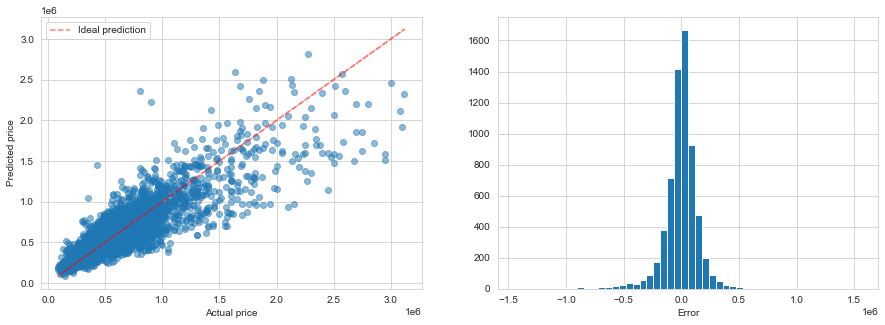

In [35]:
# Predictions
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].scatter(y_test, pred, alpha=0.5)
ax[0].plot(y_test, y_test, '--r', alpha=0.5,  label='Ideal prediction')
ax[0].set_ylabel('Predicted price')
ax[0].set_xlabel('Actual price')

ax[1].hist(x=err, bins=50)
ax[1].set_xlabel('Error')
ax[0].legend()
plt.show()